by Shashwat Amit Parikh

# **Notebook Summary:** 

Upscaling Target - 4x

Model Used - Modified version of the **EDSR** Architecture.

Data Size used - 6000 images including augmented images. (UNHCR provided images from worldstrat)

**Results :** Average PSNR ~ 24.5db , SSIM ~ 0.8 *(Check detailed results below)*


In [1]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.6/37.6 MB 56.7 MB/s eta 0:00:00:00:0100:01


# Image Extraction and Data Preparation

**Used the worldstrat dataset from Kaggle. Within this I have used The UN Refugee Agency (UNHCR) provided images.**

In [3]:
!pip install rasterio
import os
import shutil
import numpy as np
from PIL import Image, ImageFilter, ImageEnhance
import rasterio
import random
from tqdm import tqdm

KEYWORD = 'unhcr' 
N_IMAGES = 500 
src_base = '/kaggle/input/worldstrat/hr_dataset/12bit'

base_dataset_dir = '/kaggle/working/dataset/train'
hr_patch_dir = os.path.join(base_dataset_dir, 'HR')
lr_patch_dir = os.path.join(base_dataset_dir, 'LR')

temp_dest_dir = '/kaggle/working/hr_temp_raw'
temp_aug_dir = '/kaggle/working/hr_temp_augmented'

scale_factor = 4
num_augmentations_per_image = 2
rotation_angles = [90, 180, 270]

for d in [hr_patch_dir, lr_patch_dir, temp_dest_dir, temp_aug_dir]:
    os.makedirs(d, exist_ok=True)


all_folders = sorted(os.listdir(src_base))
filtered_folders = [f for f in all_folders if KEYWORD in f.lower() and os.path.isdir(os.path.join(src_base, f))]
filtered_folders = filtered_folders[:N_IMAGES]

print(f"Processing top {len(filtered_folders)} folders matching keyword '{KEYWORD}'")

for idx, folder in enumerate(tqdm(filtered_folders, desc="Extracting Filtered Tiffs")):
    folder_path = os.path.join(src_base, folder)
    tiff_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.tiff')])
    
    if len(tiff_files) >= 2:
        src_file = os.path.join(folder_path, tiff_files[1])
        dst_file = os.path.join(temp_dest_dir, f'{folder}_raw.tiff')
        shutil.copy(src_file, dst_file)

raw_files = sorted(os.listdir(temp_dest_dir))
for hr_file in tqdm(raw_files, desc="Processing & Augmenting"):
    hr_path = os.path.join(temp_dest_dir, hr_file)
    
    with rasterio.open(hr_path) as ds:
        img_array = np.stack([ds.read(1), ds.read(2), ds.read(3)], axis=2)
    
    img_array = img_array.astype(np.float32)
    low, high = np.percentile(img_array, 2), np.percentile(img_array, 98)
    if high > low:
        img_array = np.clip((img_array - low) / (high - low), 0, 1)
    
    img_array = (img_array * 255).astype(np.uint8)
    hr_img = Image.fromarray(img_array)
    
    base_name = hr_file.replace('.tiff', '')
    hr_img.save(os.path.join(temp_aug_dir, f"{base_name}_orig.tiff"))
    
    for i in range(1, num_augmentations_per_image + 1):
        aug_img = hr_img.copy()
        if random.random() > 0.5: aug_img = aug_img.transpose(Image.FLIP_LEFT_RIGHT)
        if random.random() > 0.5: aug_img = aug_img.transpose(Image.FLIP_TOP_BOTTOM)
        aug_img = aug_img.rotate(random.choice(rotation_angles))
        aug_img = ImageEnhance.Brightness(aug_img).enhance(random.uniform(0.9, 1.1))
        aug_img.save(os.path.join(temp_aug_dir, f"{base_name}_aug{i}.tiff"))


aug_files = sorted(os.listdir(temp_aug_dir))
for aug_file in tqdm(aug_files, desc="Creating Patches"):
    hr_path = os.path.join(temp_aug_dir, aug_file)
    hr_img = Image.open(hr_path)
    hr_arr = np.array(hr_img)
    
    h, w = hr_arr.shape[:2]
    h_mid, w_mid = h // 2, w // 2
    quadrants = [
        hr_arr[:h_mid, :w_mid], 
        hr_arr[:h_mid, w_mid:], 
        hr_arr[h_mid:, :w_mid], 
        hr_arr[h_mid:, w_mid:]
    ]
    
    for i, quad in enumerate(quadrants, 1):
        hr_patch_img = Image.fromarray(quad)
        patch_base_name = aug_file.replace('.tiff', f'_p{i}')
        hr_patch_img.save(os.path.join(hr_patch_dir, f"{patch_base_name}_HR.tiff"))
        
        degraded = hr_patch_img.filter(ImageFilter.GaussianBlur(radius=0.5))
        
        lr_w, lr_h = hr_patch_img.width // scale_factor, hr_patch_img.height // scale_factor
        lr_img = degraded.resize((lr_w, lr_h), Image.LANCZOS)
        
        lr_img.save(os.path.join(lr_patch_dir, f"{patch_base_name}_LR.tiff"))

shutil.rmtree(temp_dest_dir)
shutil.rmtree(temp_aug_dir)

print(f"\nProcessing Complete!")


Processing top 500 folders matching keyword 'unhcr'


Processing & Augmenting:   0%|          | 0/500 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/rasterio/__init__.py:367: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, thread_safe=thread_safe, **kwargs)
Creating Patches: 100%|██████████| 1500/1500 [01:58<00:00, 12.66it/s]



Processing Complete!


# Model Setup

## 1. HYPERPARAMETERS (EDSR ADVANCED TUNING)

In [4]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

LR_SIZE = 64
HR_SIZE = 256
SCALE = 4
BATCH_SIZE = 8  
EPOCHS = 12     
LEARNING_RATE = 1e-4 
BETA1 = 0.9
BETA2 = 0.999

# Loss Weights
WEIGHT_PIXEL = 1.0
WEIGHT_PERCEPTUAL = 0.1 
WEIGHT_TV = 1e-6         

# Sharpening Parameters
TRAIN_ON_SHARPENED = True 
SHARPEN_ALPHA = 0.4      
SHARPEN_RADIUS = 1.0

# Architecture (EDSR + Channel Attention)
NUM_RESIDUAL_BLOCKS = 32 
NUM_FEATURES = 128       
RES_SCALE = 0.1          

HR_PATH = '/kaggle/working/dataset/train/HR'
LR_PATH = '/kaggle/working/dataset/train/LR'
SAVE_PATH = '/kaggle/working/outputs'
MODEL_SAVE_PATH = '/kaggle/working/best_model.pth'

os.makedirs(SAVE_PATH, exist_ok=True)



## 2. MODEL ARCHITECTURE

Core Architecture 

I have implemented a modified version of **EDSR architecture** optimized for satellite imagery:


* Body: 32 Residual Channel Attention Blocks (RCAB).
* Mechanism: Channel Attention (CA) for spectral feature weighting.
* Depth: 128 features with a 0.1 Residual Scaling factor for stability.
* Anchor: Global Bicubic residual connection to maintain structural integrity.


In [5]:
class ChannelAttention(nn.Module):
    def __init__(self, channels, reduction=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv_du = nn.Sequential(
            nn.Conv2d(channels, channels // reduction, 1, padding=0, bias=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels // reduction, channels, 1, padding=0, bias=True),
            nn.Sigmoid()
        )
    def forward(self, x):
        return x * self.conv_du(self.avg_pool(x))

class RCABlock(nn.Module):
    def __init__(self, channels, res_scale=1.0):
        super(RCABlock, self).__init__()
        self.res_scale = res_scale
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.ca = ChannelAttention(channels)
    def forward(self, x):
        res = self.ca(self.conv2(self.relu(self.conv1(x))))
        return x + res * self.res_scale

class UpsampleBlock(nn.Module):
    def __init__(self, channels):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, x):
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        return self.relu(self.conv(x))

class EDSR_Advanced(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, num_features=128, num_blocks=32):
        super(EDSR_Advanced, self).__init__()
        self.conv_first = nn.Conv2d(in_channels, num_features, kernel_size=3, padding=1)
        self.body = nn.ModuleList([RCABlock(num_features, res_scale=RES_SCALE) for _ in range(num_blocks)])
        self.conv_after_body = nn.Conv2d(num_features, num_features, kernel_size=3, padding=1)
        self.upsample1 = UpsampleBlock(num_features)
        self.upsample2 = UpsampleBlock(num_features)
        self.conv_refine = nn.Conv2d(num_features, num_features, kernel_size=3, padding=1)
        self.relu_refine = nn.ReLU(inplace=True)
        self.conv_last = nn.Conv2d(num_features, out_channels, kernel_size=3, padding=1)

    def forward(self, lr_input):
        h, w = lr_input.shape[2], lr_input.shape[3]
        bicubic_base = F.interpolate(lr_input, size=(h*SCALE, w*SCALE), mode='bicubic', align_corners=False)
        x = self.conv_first(lr_input)
        res = x
        for block in self.body:
            res = block(res)
        res = self.conv_after_body(res)
        x = x + res 
        x = self.upsample2(self.upsample1(x))
        x = self.relu_refine(self.conv_refine(x))
        learned_residual = self.conv_last(x)
        return bicubic_base + learned_residual



## 3. LOSSES, METRICS & UTILITIES

Actually, I was getting many gridlike artifacts in my image with the earlier models.

Artifact Mitigation 

* Replaced PixelShuffle: Switched to Nearest-Neighbor Interpolation.
* Refinement: Added a $3 \times 3$ convolutional layer post-upscale to smooth spatial transitions.


In [6]:
class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3):
        super(CharbonnierLoss, self).__init__()
        self.eps = eps
    def forward(self, x, y):
        return torch.mean(torch.sqrt((x - y)**2 + self.eps**2))

class TVLoss(nn.Module):
    def forward(self, x):
        h_x, w_x = x.size()[2], x.size()[3]
        h_tv = torch.pow((x[:, :, 1:, :] - x[:, :, :h_x - 1, :]), 2).sum()
        w_tv = torch.pow((x[:, :, :, 1:] - x[:, :, :, :w_x - 1]), 2).sum()
        return (h_tv + w_tv) / (x.size()[0] * x.size()[1] * h_x * w_x)

def gaussian_blur(img, kernel_size=5, sigma=1.0):
    channels = img.shape[1]
    x = torch.linspace(-kernel_size // 2 + 1, kernel_size // 2, kernel_size).to(img.device)
    gauss = torch.exp(-x.pow(2) / (2 * sigma ** 2))
    gauss = gauss / gauss.sum()
    kernel_2d = (gauss[:, None] * gauss[None, :]).expand(channels, 1, kernel_size, kernel_size)
    return F.conv2d(img, kernel_2d, padding=kernel_size // 2, groups=channels)

def unsharp_mask(img, alpha=SHARPEN_ALPHA, sigma=SHARPEN_RADIUS):
    if alpha <= 0: return img
    blurred = gaussian_blur(img, kernel_size=5, sigma=sigma)
    return torch.clamp(img + alpha * (img - blurred), 0, 1)

class PerceptualLoss(nn.Module):
    def __init__(self):
        super().__init__()
        vgg = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1).features
        self.vgg = nn.Sequential(*list(vgg.children())[:18]).eval()
        for p in self.parameters(): p.requires_grad = False
    def forward(self, sr, hr): return F.mse_loss(self.vgg(sr), self.vgg(hr))

def calculate_psnr(sr, hr):
    mse = F.mse_loss(sr.detach(), hr)
    return (20 * torch.log10(1.0 / torch.sqrt(mse))).item() if mse > 0 else 100

def calculate_ssim(img1, img2, window_size=11):
    C1, C2 = (0.01 * 1.0)**2, (0.03 * 1.0)**2
    mu1 = F.avg_pool2d(img1, window_size, stride=1, padding=window_size//2)
    mu2 = F.avg_pool2d(img2, window_size, stride=1, padding=window_size//2)
    mu1_sq, mu2_sq, mu1_mu2 = mu1.pow(2), mu2.pow(2), mu1 * mu2
    sigma1_sq = F.avg_pool2d(img1 * img1, window_size, stride=1, padding=window_size//2) - mu1_sq
    sigma2_sq = F.avg_pool2d(img2 * img2, window_size, stride=1, padding=window_size//2) - mu2_sq
    sigma12 = F.avg_pool2d(img1 * img2, window_size, stride=1, padding=window_size//2) - mu1_mu2
    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))
    return ssim_map.mean().item()

class SatelliteDataset(Dataset):
    def __init__(self, hr_dir, lr_dir):
        self.hr_files = sorted([os.path.join(hr_dir, f) for f in os.listdir(hr_dir) if f.endswith(('.png', '.tiff'))])
        self.lr_files = sorted([os.path.join(lr_dir, f) for f in os.listdir(lr_dir) if f.endswith(('.png', '.tiff'))])
        self.hr_tf = transforms.Compose([transforms.CenterCrop(HR_SIZE), transforms.ToTensor()])
        self.lr_tf = transforms.Compose([transforms.CenterCrop(LR_SIZE), transforms.ToTensor()])
    def __len__(self): return len(self.hr_files)
    def __getitem__(self, idx):
        return self.lr_tf(Image.open(self.lr_files[idx]).convert('RGB')), self.hr_tf(Image.open(self.hr_files[idx]).convert('RGB'))

def visualize_samples(model, dataset, device, epoch, num_samples=4):
    model.eval()
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    fig, axes = plt.subplots(num_samples, 5, figsize=(25, 5 * num_samples))
    for i, idx in enumerate(indices):
        lr, hr = dataset[idx]
        hr = hr.to(device).unsqueeze(0)
        with torch.no_grad():
            sr_raw = model(lr.unsqueeze(0).to(device))
            sr_sharp = unsharp_mask(sr_raw)
        bicubic = F.interpolate(lr.unsqueeze(0).to(device), size=(HR_SIZE, HR_SIZE), mode='bicubic').clamp(0, 1)
        psnr_bi, ssim_bi = calculate_psnr(bicubic, hr), calculate_ssim(bicubic, hr)
        psnr_sr, ssim_sr = calculate_psnr(sr_raw, hr), calculate_ssim(sr_raw, hr)
        psnr_sh, ssim_sh = calculate_psnr(sr_sharp, hr), calculate_ssim(sr_sharp, hr)
        
        imgs = [lr, bicubic.squeeze(0).cpu(), sr_raw.squeeze(0).cpu().clamp(0,1), sr_sharp.squeeze(0).cpu().clamp(0,1), hr.squeeze(0).cpu()]
        titles = [
            "Low Resolution Input", 
            f"Bicubic Interpolation\nPSNR: {psnr_bi:.2f} SSIM: {ssim_bi:.3f}", 
            f"Model Prediction (Raw)\nPSNR: {psnr_sr:.2f} SSIM: {ssim_sr:.3f}", 
            f"Model Prediction (Sharpened)\nPSNR: {psnr_sh:.2f} SSIM: {ssim_sh:.3f}", 
            "Ground Truth (High Res)"
        ]
        for j in range(5):
            axes[i, j].imshow(imgs[j].permute(1,2,0))
            axes[i, j].set_title(titles[j], fontsize=10)
            axes[i, j].axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(SAVE_PATH, f'epoch_{epoch+1}.png'))
    plt.show()



# Training and Evaluation

Evaluated on SSIM and PSNR scores. 

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:02<00:00, 207MB/s] 


Training on 4800 samples, Validating on 1200 samples...
Epoch 1/12 | Loss: 0.1730 | PSNR: 23.4dB | SSIM: 0.765
Epoch 2/12 | Loss: 0.1601 | PSNR: 23.7dB | SSIM: 0.775
Epoch 3/12 | Loss: 0.1565 | PSNR: 23.8dB | SSIM: 0.778
Epoch 4/12 | Loss: 0.1539 | PSNR: 23.9dB | SSIM: 0.782
Epoch 5/12 | Loss: 0.1518 | PSNR: 24.0dB | SSIM: 0.785


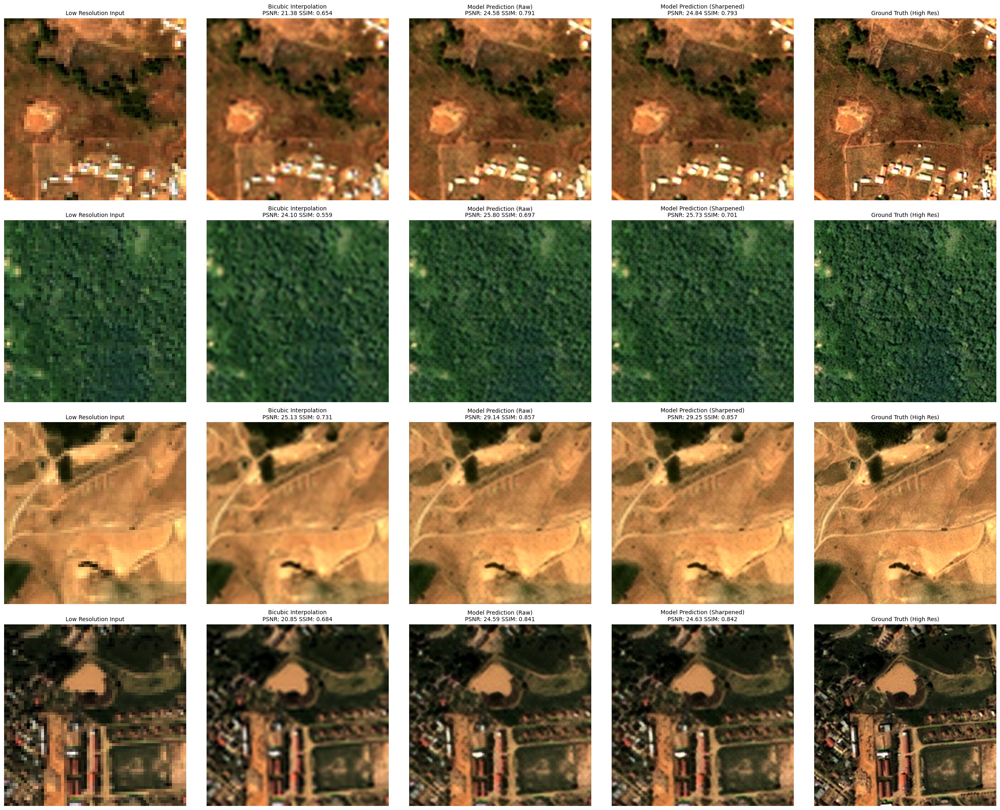

Epoch 6/12 | Loss: 0.1501 | PSNR: 24.1dB | SSIM: 0.787
Epoch 7/12 | Loss: 0.1485 | PSNR: 24.2dB | SSIM: 0.789
Epoch 8/12 | Loss: 0.1471 | PSNR: 24.2dB | SSIM: 0.791
Epoch 9/12 | Loss: 0.1459 | PSNR: 24.3dB | SSIM: 0.792
Epoch 10/12 | Loss: 0.1448 | PSNR: 24.3dB | SSIM: 0.792


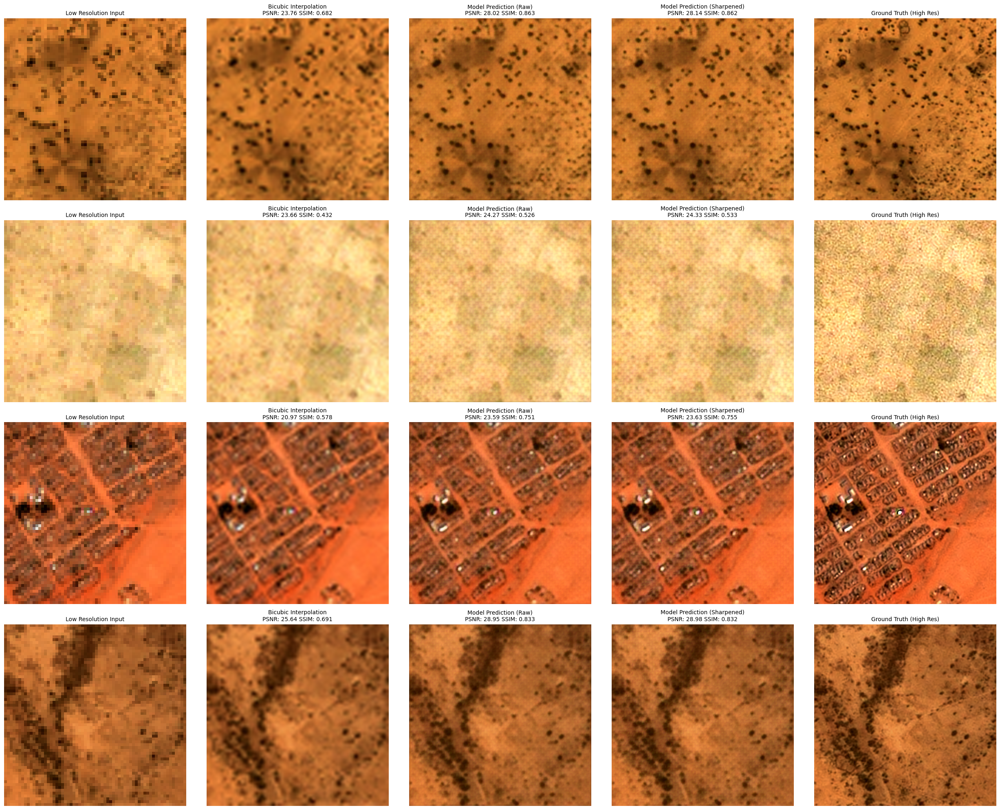

Epoch 11/12 | Loss: 0.1439 | PSNR: 24.3dB | SSIM: 0.793
Epoch 12/12 | Loss: 0.1429 | PSNR: 24.4dB | SSIM: 0.794


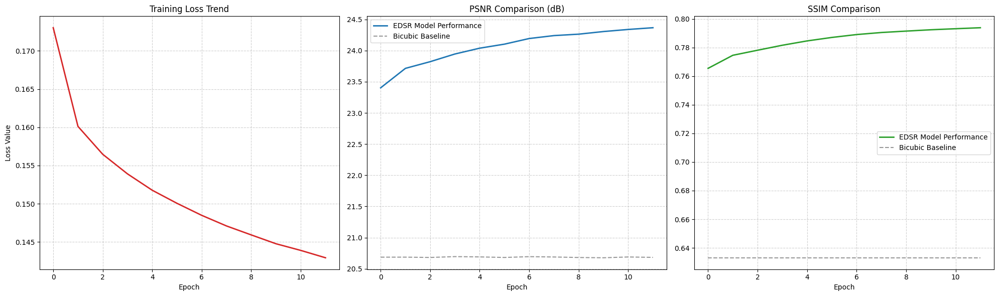

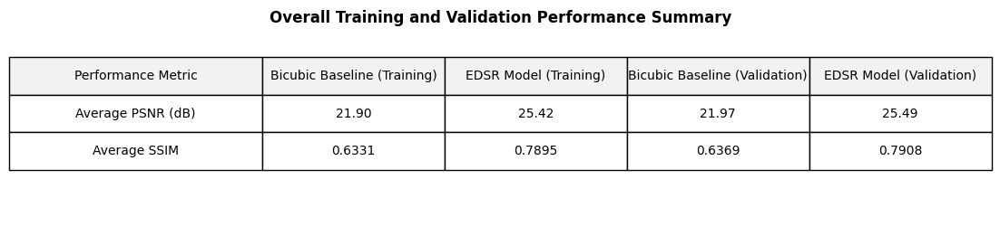

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EDSR_Advanced(num_features=NUM_FEATURES, num_blocks=NUM_RESIDUAL_BLOCKS).to(device)

criterion_pixel = CharbonnierLoss().to(device)
criterion_perceptual = PerceptualLoss().to(device)
criterion_tv = TVLoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=5)

history = {'loss': [], 'psnr_model': [], 'psnr_bicubic': [], 'ssim_model': [], 'ssim_bicubic': []}

if os.path.exists(HR_PATH):
    full_dataset = SatelliteDataset(HR_PATH, LR_PATH)
    train_size = int(0.8 * len(full_dataset))
    val_size = len(full_dataset) - train_size
    train_ds, val_ds = random_split(full_dataset, [train_size, val_size])
    
    loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True)
    best_psnr = 0
    print(f"Training on {train_size} samples, Validating on {val_size} samples...")

    for epoch in range(EPOCHS):
        model.train()
        epoch_loss, epoch_psnr, epoch_bi_psnr, epoch_ssim, epoch_bi_ssim = 0, 0, 0, 0, 0
        for lr, hr in loader:
            lr, hr = lr.to(device), hr.to(device)
            optimizer.zero_grad()
            sr = model(lr)
            sr_f = unsharp_mask(sr) if TRAIN_ON_SHARPENED else sr
            loss = WEIGHT_PIXEL*criterion_pixel(sr_f, hr) + WEIGHT_PERCEPTUAL*criterion_perceptual(sr_f, hr) + WEIGHT_TV*criterion_tv(sr_f)
            loss.backward(); optimizer.step()
            epoch_loss += loss.item()
            epoch_psnr += calculate_psnr(sr_f.clamp(0,1), hr)
            epoch_ssim += calculate_ssim(sr_f.clamp(0,1), hr)
            bi = F.interpolate(lr, size=(HR_SIZE, HR_SIZE), mode='bicubic').clamp(0,1)
            epoch_bi_psnr += calculate_psnr(bi, hr); epoch_bi_ssim += calculate_ssim(bi, hr)
            
        avg_loss, avg_psnr, avg_bi_psnr = epoch_loss/len(loader), epoch_psnr/len(loader), epoch_bi_psnr/len(loader)
        avg_ssim, avg_bi_ssim = epoch_ssim/len(loader), epoch_bi_ssim/len(loader)
        
        history['loss'].append(avg_loss)
        history['psnr_model'].append(avg_psnr); history['psnr_bicubic'].append(avg_bi_psnr)
        history['ssim_model'].append(avg_ssim); history['ssim_bicubic'].append(avg_bi_ssim)
        
        scheduler.step(avg_loss)
        if avg_psnr > best_psnr:
            best_psnr = avg_psnr
            torch.save(model.state_dict(), MODEL_SAVE_PATH)
        print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {avg_loss:.4f} | PSNR: {avg_psnr:.1f}dB | SSIM: {avg_ssim:.3f}")
        if (epoch+1) % 5 == 0: visualize_samples(model, val_ds, device, epoch)

    model.load_state_dict(torch.load(MODEL_SAVE_PATH)); model.eval()
    def get_metrics(ds):
        dl = DataLoader(ds, batch_size=1)
        p_bi, s_bi, p_sr, s_sr = 0, 0, 0, 0
        with torch.no_grad():
            for lr, hr in dl:
                lr, hr = lr.to(device), hr.to(device)
                sr = model(lr).clamp(0,1)
                bi = F.interpolate(lr, size=(HR_SIZE, HR_SIZE), mode='bicubic').clamp(0,1)
                p_bi += calculate_psnr(bi, hr); s_bi += calculate_ssim(bi, hr)
                p_sr += calculate_psnr(sr, hr); s_sr += calculate_ssim(sr, hr)
        return p_bi/len(ds), s_bi/len(ds), p_sr/len(ds), s_sr/len(ds)

    train_metrics = get_metrics(train_ds)
    val_metrics = get_metrics(val_ds)

    # Plot History Graphs
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    axes[0].plot(history['loss'], color='tab:red', linewidth=2)
    axes[0].set_title('Training Loss Trend')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss Value')
    axes[0].grid(True, linestyle='--', alpha=0.6)

    axes[1].plot(history['psnr_model'], label='EDSR Model Performance', color='tab:blue', linewidth=2)
    axes[1].plot(history['psnr_bicubic'], label='Bicubic Baseline', linestyle='--', color='tab:gray', alpha=0.8)
    axes[1].set_title('PSNR Comparison (dB)')
    axes[1].set_xlabel('Epoch')
    axes[1].legend()
    axes[1].grid(True, linestyle='--', alpha=0.6)

    axes[2].plot(history['ssim_model'], label='EDSR Model Performance', color='tab:green', linewidth=2)
    axes[2].plot(history['ssim_bicubic'], label='Bicubic Baseline', linestyle='--', color='tab:gray', alpha=0.8)
    axes[2].set_title('SSIM Comparison')
    axes[2].set_xlabel('Epoch')
    axes[2].legend()
    axes[2].grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.savefig(os.path.join(SAVE_PATH, 'training_summary.png'))
    plt.show()

    # Create Summary Table
    table_data = [
        ["Performance Metric", "Bicubic Baseline (Training)", "EDSR Model (Training)", "Bicubic Baseline (Validation)", "EDSR Model (Validation)"],
        ["Average PSNR (dB)", f"{train_metrics[0]:.2f}", f"{train_metrics[2]:.2f}", f"{val_metrics[0]:.2f}", f"{val_metrics[2]:.2f}"],
        ["Average SSIM", f"{train_metrics[1]:.4f}", f"{train_metrics[3]:.4f}", f"{val_metrics[1]:.4f}", f"{val_metrics[3]:.4f}"]
    ]
    
    fig, ax = plt.subplots(figsize=(12, 3))
    ax.axis('off')
    summary_table = ax.table(
        cellText=table_data, 
        loc='center', 
        cellLoc='center', 
        colWidths=[0.25, 0.18, 0.18, 0.18, 0.18],
        cellColours=[['#f2f2f2']*5, ['#ffffff']*5, ['#ffffff']*5]
    )
    summary_table.auto_set_font_size(False)
    summary_table.set_fontsize(10)
    summary_table.scale(1.2, 2.5)
    plt.title("Overall Training and Validation Performance Summary", y=0.9, fontweight='bold')
    plt.show()
    
    
else:
    print("Dataset directory not found.")

# *Technical Novelties*


* **In-Loop Sharpening:** Integrated a differentiable Unsharp Mask (USM) filter directly into the training process.
* **Global-to-Local Learning:** Dual-path learning using a global Bicubic skip and local residual refinement.
* **Intensity Preservation:** Removed Batch Normalization to preserve the absolute intensity range of satellite sensors.

